<a href="https://colab.research.google.com/github/zafor158/Car-License-Template-Detection-Using-YOLO-V11/blob/main/License_Plate_Project_Using_yolo_v11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**License Plate Project using YOLO11 Object Detection Model**

Data: https://universe.roboflow.com/test-vaxvp/license-plate-project-adaad/dataset/1#

In [ ]:
!nvidia-smi

Sat Oct 26 05:07:48 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**Step 01 # Install the Ultralytics Package**

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.6/877.6 kB 14.9 MB/s eta 0:00:00


**Step 02 # Import All the Requried Libraries**

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.3/112.6 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import Image

**Step # 03 Download Dataset from Roboflow**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="E7lirVXPjsnh1byhjaK4")
project = rf.workspace("test-vaxvp").project("license-plate-project-adaad")
version = project.version(1)
dataset = version.download("yolov11")




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to License-Plate-Project-1 in yolov11:: 100%|██████████| 47074/47074 [00:08<00:00, 5512.32it/s]


In [ ]:
dataset.location

'/content/License-Plate-Project-1'

**Step # 04 Train YOLO11 Model on a Custom Dataset**

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=10 imgsz=120

100% 5.35M/5.35M [00:00<00:00, 66.1MB/s]
Ultralytics 8.3.22 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/License-Plate-Project-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=120, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

In [ ]:
import shutil

# Define source and destination paths
source_path = "/content/runs/detect/train/weights/best.pt"  # Path to the best model
destination_path = "/content/License-Plate-Project-1/best_model.pt"  # Specify where you want to save the model

# Copy the model file to the desired location
shutil.copy(source_path, destination_path)

print("Model saved successfully at:", destination_path)

Model saved successfully at: /content/License-Plate-Project-1/best_model.pt


**Step # 05 Examine Training Results**

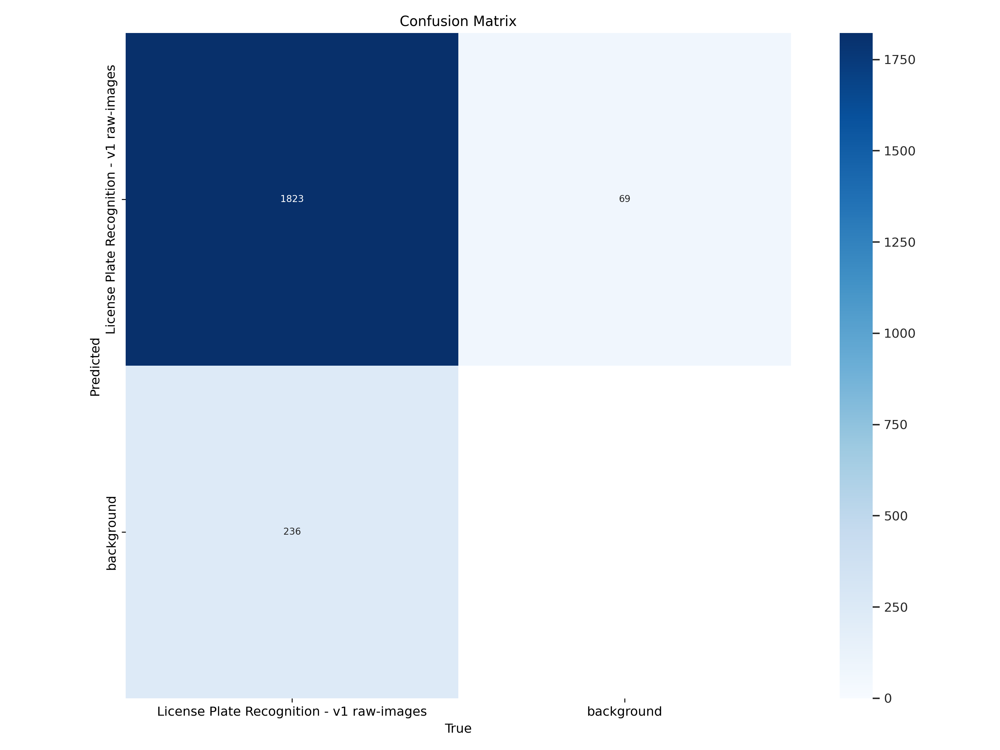

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

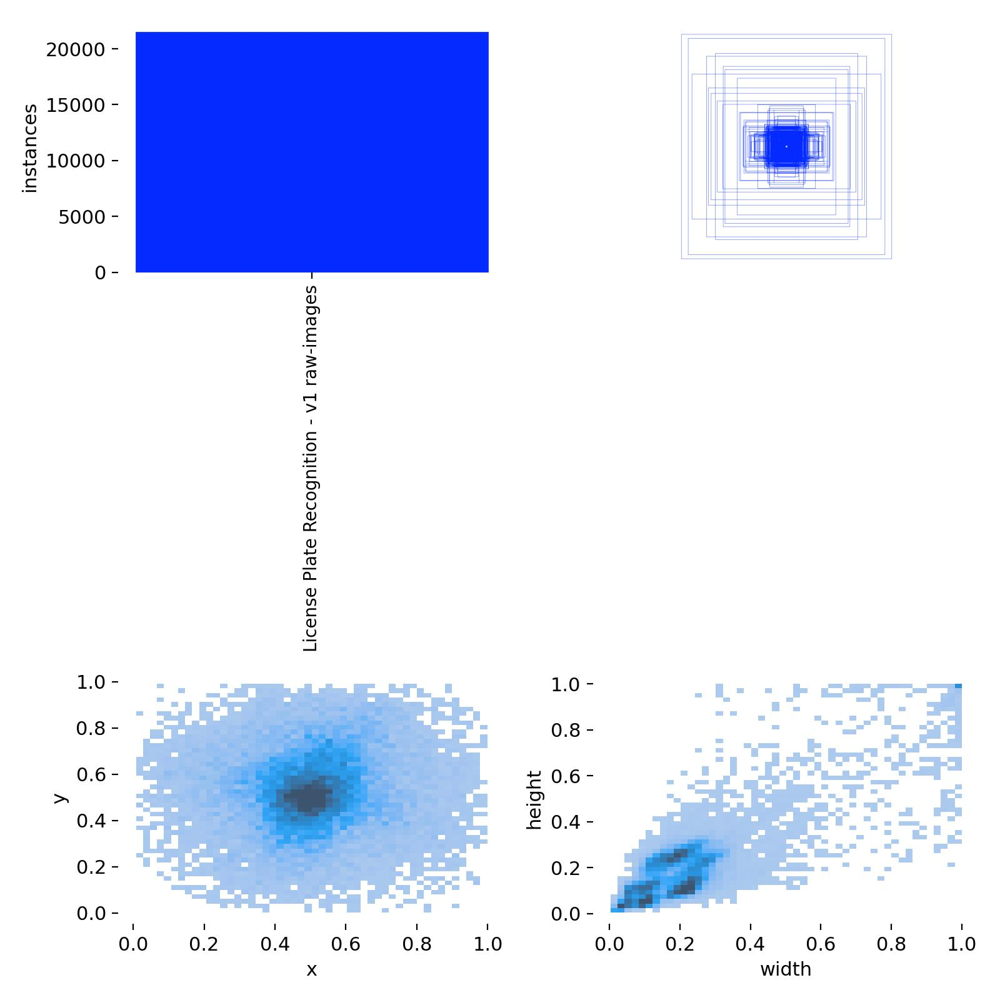

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

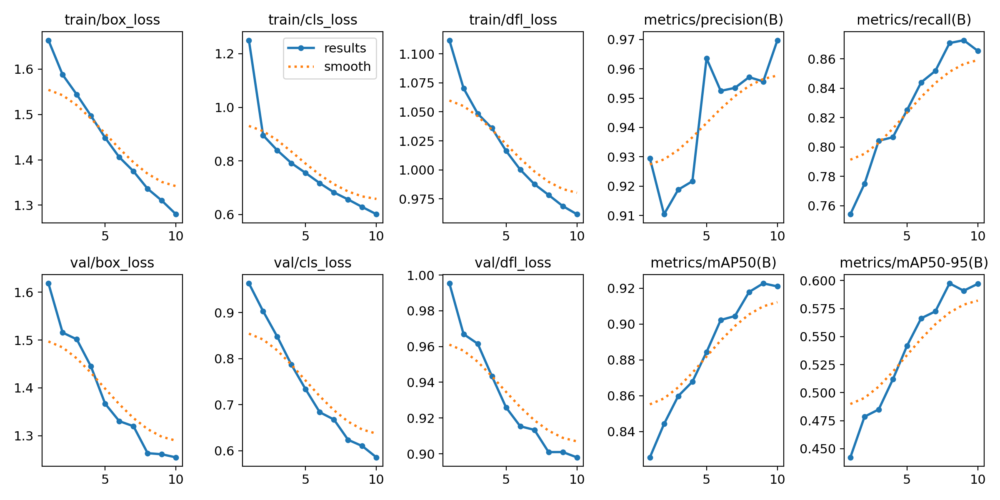

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

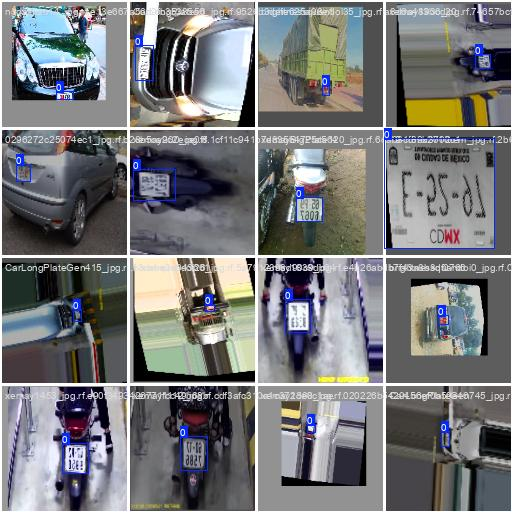

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

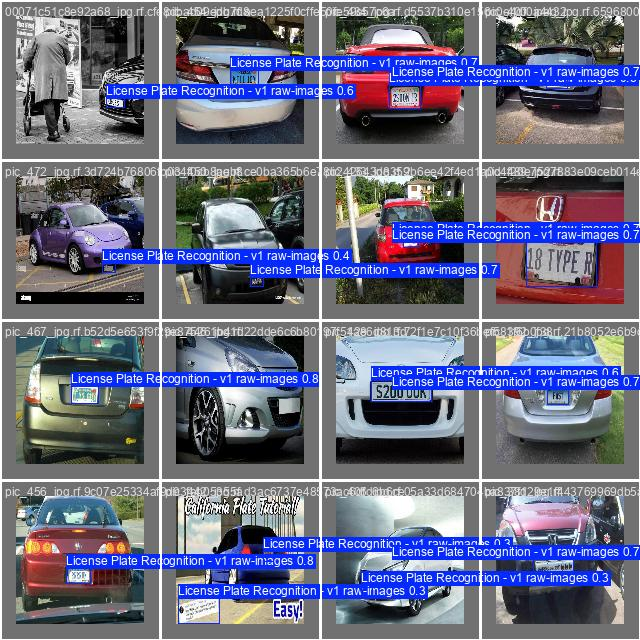

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

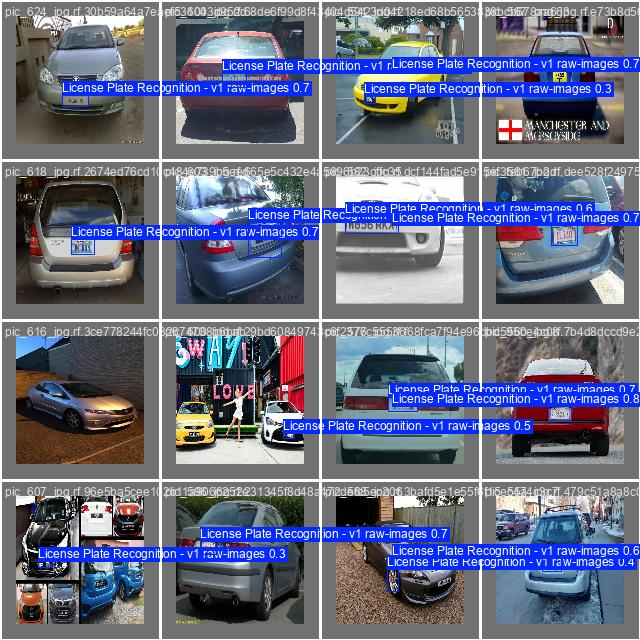

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

**Step # 07  Validate Fine-Tuned Model**

In [ ]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.22 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/License-Plate-Project-1/valid/labels.cache... 1973 images, 0 backgrounds, 0 corrupt: 100% 1973/1973 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 124/124 [00:16<00:00,  7.52it/s]
                   all       1973       2059      0.956       0.87      0.917      0.597
Speed: 0.1ms preprocess, 1.7ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


**Step # 08 Inference with Custom Model on Images**

In [ ]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.22 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs

image 1/978 /content/License-Plate-Project-1/test/images/0002a5b67e5f0909_jpg.rf.300ba325f1e5e11ec6fdb10e70d11f4b.jpg: 128x128 1 License Plate Recognition - v1 raw-images, 13.3ms
image 2/978 /content/License-Plate-Project-1/test/images/000812dcf304a8e7_jpg.rf.f0b445cb199333b34743798d98cdb57b.jpg: 128x128 1 License Plate Recognition - v1 raw-images, 9.3ms
image 3/978 /content/License-Plate-Project-1/test/images/0010f4c10f7ab07e_jpg.rf.6aa0a7fccae068586c77cd9b3a165cbb.jpg: 128x128 (no detections), 8.2ms
image 4/978 /content/License-Plate-Project-1/test/images/001cdd25e148cd36_jpg.rf.c59f608edbeada6b32926d693afa4c74.jpg: 128x128 1 License Plate Recognition - v1 raw-images, 8.0ms
image 5/978 /content/License-Plate-Project-1/test/images/002519f868563098_jpg.rf.747ddee18711caaf4eec8c2788f18a53.jpg: 128x128 (no detections), 8.4ms

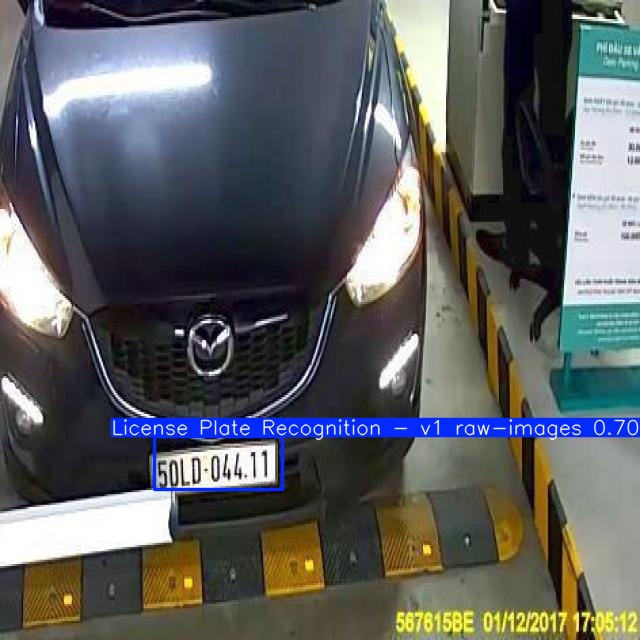

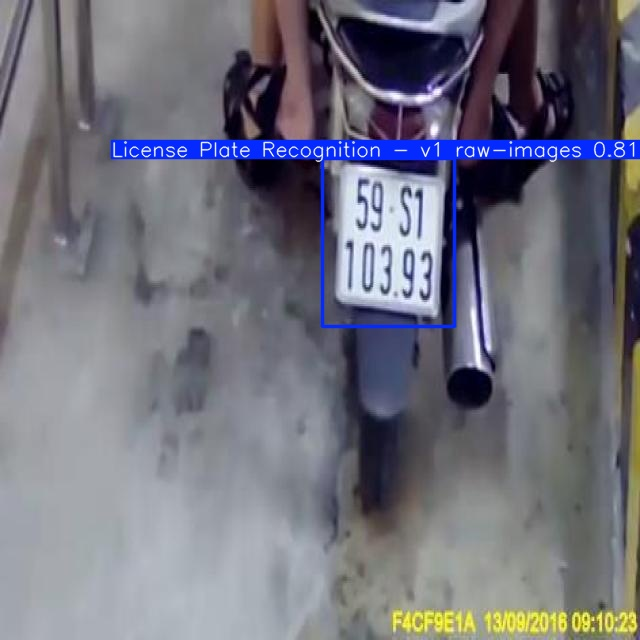

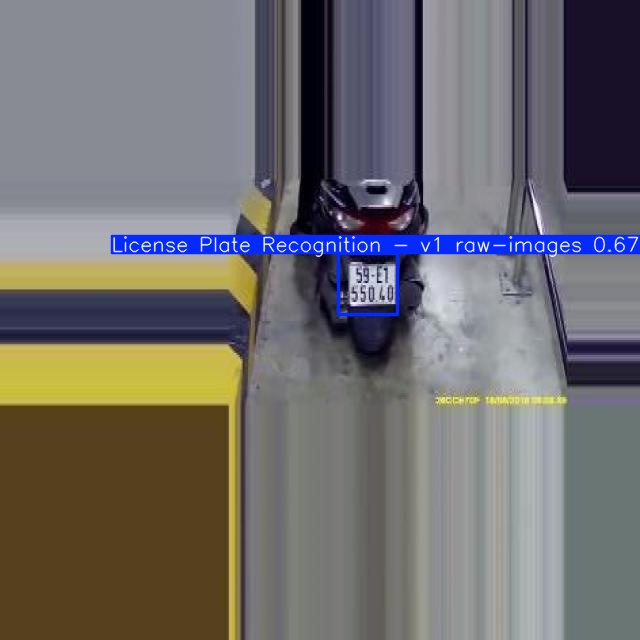

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [ ]:
!gdown "https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t
To: /content/image2.jpg
100% 77.7k/77.7k [00:00<00:00, 112MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=image2.jpg save=True

Ultralytics 8.3.22 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image2.jpg: 128x128 (no detections), 13.9ms
Speed: 0.8ms preprocess, 13.9ms inference, 31.3ms postprocess per image at shape (1, 3, 128, 128)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


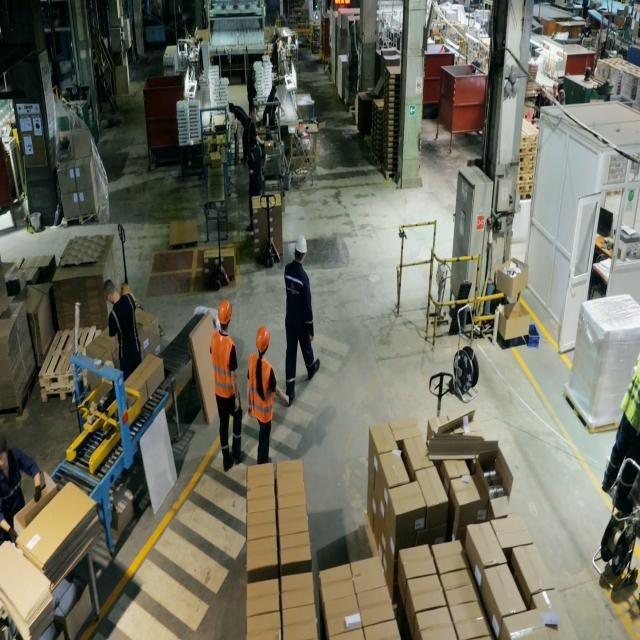

In [ ]:
Image("/content/runs/detect/predict2/image2.jpg", width=600)

**Step # 08 Inference with Custom Model on Videos**

In [ ]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

100% 14.2M/14.2M [00:00<00:00, 51.3MB/s]


In [ ]:
!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /content/PPE_Part2.mp4
100% 11.1M/11.1M [00:00<00:00, 51.0MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source="PPE_Part1.mp4" save=True

Ultralytics 8.3.22 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/310) /content/PPE_Part1.mp4: 96x128 (no detections), 39.3ms
video 1/1 (frame 2/310) /content/PPE_Part1.mp4: 96x128 (no detections), 17.2ms
video 1/1 (frame 3/310) /content/PPE_Part1.mp4: 96x128 (no detections), 8.6ms
video 1/1 (frame 4/310) /content/PPE_Part1.mp4: 96x128 (no detections), 11.9ms
video 1/1 (frame 5/310) /content/PPE_Part1.mp4: 96x128 (no detections), 12.7ms
video 1/1 (frame 6/310) /content/PPE_Part1.mp4: 96x128 (no detections), 12.3ms
video 1/1 (frame 7/310) /content/PPE_Part1.mp4: 96x128 (no detections), 14.6ms
video 1/1 (frame 8/310) /content/PPE_Part1.mp4: 96x128 (no detections), 12.9ms
video 1/1 (frame 9/310) /content/PPE_Part1.mp4: 96x128 (no detections), 9.4ms
video 1/1 (frame 10/310) /content/PPE_Part1.mp4: 96x128 (no detections), 12.5ms
video 1/1 (frame 11/310) /content/PPE_Part1.m

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
!pip install -q streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 51.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 kB 7.1 MB/s eta 0:00:00


In [ ]:
%%writefile app.py
import streamlit as st
import cv2
import tempfile
import numpy as np
from PIL import Image
from ultralytics import YOLO

# Load your trained YOLO model
model_path = "/content/best_model.pt"
model = YOLO(model_path)
st.title("Innovative License Plate Detection App")

# Sidebar for options
st.sidebar.title("Options")
option = st.sidebar.selectbox("Choose Input Method:", ("Upload Image", "Upload Video", "Take a Picture"))

# Define a function to load and preprocess images
def load_image(img):
    return np.array(Image.open(img))

# License plate detection function with support for multiple detections and confidence adjustment
def detect_license_plate(image, confidence_threshold=0.1):
    # Convert to RGB if needed
    if len(image.shape) == 3 and image.shape[2] == 4:
        image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)
    elif len(image.shape) == 2:  # Grayscale image
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # Run the model on the image with a specified confidence threshold
    results = model(image, conf=confidence_threshold)  # Set confidence threshold for detection

    # Create a copy of the image to annotate
    annotated_image = image.copy()

    # Draw all bounding boxes on the image
    boxes = results[0].boxes  # Extract all bounding boxes from results
    if boxes is not None and len(boxes) > 0:
        for box in boxes:
            if float(box.conf) >= confidence_threshold:  # Only display boxes above threshold
                # Draw each box on the annotated image
                x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get coordinates for the box
                cv2.rectangle(annotated_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                confidence = float(box.conf)  # Confidence level for the box
                cv2.putText(annotated_image, f"{confidence:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    return annotated_image, boxes  # Returns the annotated image and all boxes

# Streamlit app workflow
if option == "Upload Image":
    uploaded_file = st.file_uploader("Upload an Image", type=["jpg", "jpeg", "png"])
    if uploaded_file:
        image = load_image(uploaded_file)
        st.image(image, caption="Uploaded Image", use_column_width=True)

        # Detect license plates
        st.write("Detecting license plates...")
        annotated_image, boxes = detect_license_plate(image)

        # Display detected image with all bounding boxes
        st.image(annotated_image, caption="Detection Result with All Plates", use_column_width=True)

        # Display details of each detected license plate if any are found
        if boxes is not None and len(boxes) > 0:
            st.write("Detected License Plates:")
            for idx, box in enumerate(boxes):
                confidence = float(box.conf)  # Convert tensor to float
                st.write(f"License Plate {idx + 1}: Confidence = {confidence:.2f}")
        else:
            st.write("No license plates detected.")

elif option == "Upload Video":
    uploaded_video = st.file_uploader("Upload a Video", type=["mp4", "mov", "avi"])
    if uploaded_video:
        tfile = tempfile.NamedTemporaryFile(delete=False)
        tfile.write(uploaded_video.read())
        cap = cv2.VideoCapture(tfile.name)

        stframe = st.empty()
        st.write("Detecting license plates in video...")

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            # Run detection on each frame
            annotated_frame, boxes = detect_license_plate(frame)

            # Display results
            stframe.image(annotated_frame, channels="RGB")
        cap.release()

elif option == "Take a Picture":
    picture = st.camera_input("Take a Picture")
    if picture:
        image = load_image(picture)
        st.image(image, caption="Captured Image", use_column_width=True)

        # Detect license plates
        st.write("Detecting license plates...")
        annotated_image, boxes = detect_license_plate(image)

        # Display detected image with bounding boxes
        st.image(annotated_image, caption="Detection Result with All Plates", use_column_width=True)

        # Display details of each detected license plate if any are found
        if boxes is not None and len(boxes) > 0:
            st.write("Detected License Plates:")
            for idx, box in enumerate(boxes):
                confidence = float(box.conf)  # Convert tensor to float
                st.write(f"License Plate {idx + 1}: Confidence = {confidence:.2f}")
        else:
            st.write("No license plates detected.")

st.sidebar.write("Made with ❤️ using YOLO and Streamlit")


Overwriting app.py


In [ ]:
!wget -q -O - ipv4.icanhazip.com

35.237.85.118


In [ ]:
!streamlit run app.py & npx localtunnel --port 8501




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://35.237.85.118:8501

your url is: https://cruel-forks-float.loca.lt
2024-10-26 05:33:18.732 Examining the path of torch.classes raised: Tried to instantiate class '__path__._path', but it does not exist! Ensure that it is registered via torch::class_

0: 96x128 2 License Plate Recognition - v1 raw-imagess, 71.8ms
Speed: 1.0ms preprocess, 71.8ms inference, 675.5ms postprocess per image at shape (1, 3, 96, 128)
2024-10-26 05:33:27.911 Examining the path of torch.classes raised: Tried to instantiate class '__path__._path', but it does not exist! Ensure that it is registered via torch::class_

0: 96x128 2 License Plate Recognition - v1 raw-imagess, 37.8ms
Speed: 0.4ms preprocess, 37.8ms inference, 1.1ms postprocess per image at shape (1, 3, 96, 128)

0: 96x128 1 License Plate Recognition - v1 raw-images, 41.3ms
Speed: 0.5ms preprocess, 4